# Loading in Evaluation Environment:

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive/')

Mounted at /content/gdrive/


In [ ]:
#ONLY FOR COLLAB RUNTIME
%load_ext tensorboard
%tensorflow_version 1.x

TensorFlow 1.x selected.


In [ ]:
#ONLY FOR COLLAB RUNTIME
!pip install stable-baselines[mpi]==2.10.1 --quiet
!pip install pyvirtualdisplay
!pip install procgen --quiet
!pip install gym --quiet
!pip install gym3 --quiet
!pip install tensorflow-gpu==1.15.2 --quiet

     |████████████████████████████████| 245kB 31.5MB/s 
     |████████████████████████████████| 39.9MB 75kB/s 
     |████████████████████████████████| 51kB 8.8MB/s 
     |████████████████████████████████| 22.2MB 1.5MB/s 
     |████████████████████████████████| 3.3MB 36.6MB/s 
     |████████████████████████████████| 675kB 46.8MB/s 
     |████████████████████████████████| 204kB 58.6MB/s 
     |████████████████████████████████| 40kB 7.2MB/s 
ERROR: albumentations 0.1.12 has requirement imgaug<0.2.7,>=0.2.5, but you'll have imgaug 0.2.9 which is incompatible.
     |████████████████████████████████| 411.0MB 41kB/s 


In [ ]:
from gym3 import ToGymEnv, ViewerWrapper, ExtractDictObWrapper
from stable_baselines.common.vec_env.dummy_vec_env import DummyVecEnv
from procgen import ProcgenGym3Env
import pickle

env_id = 'fruitbot'
env = ProcgenGym3Env(num=1, env_name=env_id, distribution_mode='easy', num_levels=500)
states = pickle.load(open('/content/gdrive/MyDrive/CSW182 Final/Evaluation/eval_env.pickle', 'rb'))
env.callmethod("set_state", states)
env = ExtractDictObWrapper(env, key="rgb")
env = ToGymEnv(env)
env = DummyVecEnv([lambda:env])

The TensorFlow contrib module will not be included in TensorFlow 2.0.
For more information, please see:
  * https://github.com/tensorflow/community/blob/master/rfcs/20180907-contrib-sunset.md
  * https://github.com/tensorflow/addons
  * https://github.com/tensorflow/io (for I/O related ops)
If you depend on functionality not listed there, please file an issue.



#PPO2 BASELINE

In [ ]:
#BASELINE
import sys
sys.path.append('/content/gdrive/MyDrive/CSW182 Final')

import imageio
import time
import numpy as np
import base64
import IPython
import PIL.Image
import pyvirtualdisplay
import pickle

# Video 
from pathlib import Path
from IPython import display as ipythondisplay

# Stable baselines

from helpers import record
from ImpalaCnn import ImpalaCnn

from stable_baselines import PPO2
from stable_baselines.common.evaluation import evaluate_policy
from gym3 import ToGymEnv, ViewerWrapper, ExtractDictObWrapper
from stable_baselines.common.vec_env.dummy_vec_env import DummyVecEnv
from procgen import ProcgenGym3Env

## Evaluating 50ppo2 Model:

In [ ]:
ppo50model = PPO2.load('/content/gdrive/MyDrive/CSW182 Final/50FruitBot/50ppo2_impala.best', env = env, policy=ImpalaCnn)

In [ ]:
ppo50score = evaluate_policy(ppo50model, env, n_eval_episodes=100, deterministic=True, render=False, callback=None, reward_threshold=None, return_episode_rewards=False)[0]
print(ppo50length)
record(ppo50model, length=1000)

12.61


## Evaluating 100ppo2 Model:

In [ ]:
ppo100model = PPO2.load('/content/gdrive/MyDrive/CSW182 Final/100FruitBot/100ppo2_impala.best', env = env, policy=ImpalaCnn)

In [ ]:
ppo100score = evaluate_policy(ppo100model, env, n_eval_episodes=100, deterministic=True, render=False, callback=None, reward_threshold=None, return_episode_rewards=False)[0]
print(ppo100length)
record(ppo100model, length=1000)

13.88


## Evaluating 250ppo2 Model:

In [ ]:
ppo250model = PPO2.load('/content/gdrive/MyDrive/CSW182 Final/250FruitBot/250ppo2_impala.best', env = env, policy=ImpalaCnn)

In [ ]:
ppo250score = evaluate_policy(ppo250model, env, n_eval_episodes=100, deterministic=True, render=False, callback=None, reward_threshold=None, return_episode_rewards=False)[0]
print(ppo250length)
record(ppo250model, length=1000)

15.68


## Evaluating 500ppo2 Model:

In [ ]:
ppo500model = PPO2.load('/content/gdrive/MyDrive/CSW182 Final/500FruitBot/500ppo2_impala.best', env = env, policy=ImpalaCnn)

In [ ]:
ppo500score = evaluate_policy(ppo500model, env, n_eval_episodes=100, deterministic=True, render=False, callback=None, reward_threshold=None, return_episode_rewards=False)[0]
print(ppo500length)
record(ppo500model, length=1000)

20.68


#MIXREG NON-DECOUPLED

In [ ]:
#MIXREG NON_DECOUPLED

import sys
sys.path.append('/content/gdrive/MyDrive/CSW182 Final')

import imageio
import time
import numpy as np
import base64
import IPython
import PIL.Image
import pyvirtualdisplay
import pickle

# Video 
from pathlib import Path
from IPython import display as ipythondisplay

# Stable baselines

from helpers import record
from MIXREG_ImpalaCnn import ImpalaCnn

from mixreg import MIXREG
from stable_baselines.common.evaluation import evaluate_policy
from gym3 import ToGymEnv, ViewerWrapper, ExtractDictObWrapper
from stable_baselines.common.vec_env.dummy_vec_env import DummyVecEnv
from procgen import ProcgenGym3Env

## Evaluating 50mixreg Model:

In [ ]:
mixreg50model = MIXREG.load('/content/gdrive/MyDrive/CSW182 Final/50FruitBot/50mixreg_impala.best', env = env, policy=ImpalaCnn)

In [ ]:
mixreg50score = evaluate_policy(mixreg50model, env, n_eval_episodes=100, deterministic=True, render=False, callback=None, reward_threshold=None, return_episode_rewards=False)[0]
print(mixreg50score)
record(mixreg50model, length=1000)

Output hidden; open in https://colab.research.google.com to view.

## Evaluating 100mixreg Model:

In [ ]:
mixreg100model = MIXREG.load('/content/gdrive/MyDrive/CSW182 Final/100FruitBot/100mixreg_impala.best', env = env, policy=ImpalaCnn)

In [ ]:
mixreg100score = evaluate_policy(mixreg100model, env, n_eval_episodes=100, deterministic=True, render=False, callback=None, reward_threshold=None, return_episode_rewards=False)[0]
print(mixreg100score)
record(mixreg100model, length=1000)

15.93


## Evaluating 250mixreg Model:

In [ ]:
mixreg250model = MIXREG.load('/content/gdrive/MyDrive/CSW182 Final/250FruitBot/250mixreg_impala.best', env = env, policy=ImpalaCnn)

In [ ]:
mixreg250score = evaluate_policy(mixreg250model, env, n_eval_episodes=100, deterministic=True, render=False, callback=None, reward_threshold=None, return_episode_rewards=False)[0]
print(mixreg250score)
record(mixreg250model, length=1000)

Output hidden; open in https://colab.research.google.com to view.

## Evaluating 500mixreg Model:

In [ ]:
mixreg500model = MIXREG.load('/content/gdrive/MyDrive/CSW182 Final/500FruitBot/500mixreg_impala.best', env = env, policy=ImpalaCnn)

In [ ]:
mixreg500score = evaluate_policy(mixreg500model, env, n_eval_episodes=100, deterministic=True, render=False, callback=None, reward_threshold=None, return_episode_rewards=False)[0]
print(mixreg500score)
record(mixreg500model, length=1000)

21.25


#MIXREG DECOUPLED

In [ ]:
#MIXREG DECOUPLED
import sys
sys.path.append('/content/gdrive/MyDrive/CSW182 Final')

import imageio
import time
import numpy as np
import base64
import IPython
import PIL.Image
import pyvirtualdisplay
import pickle

# Video 
from pathlib import Path
from IPython import display as ipythondisplay

# Stable baselines

from helpers import record
from DECOUPLED_ImpalaCnn import ImpalaCnn

from mixreg import MIXREG
from stable_baselines.common.evaluation import evaluate_policy
from gym3 import ToGymEnv, ViewerWrapper, ExtractDictObWrapper
from stable_baselines.common.vec_env.dummy_vec_env import DummyVecEnv
from procgen import ProcgenGym3Env

## Evaluating 50decoupled Model:

In [ ]:
decoupled50model = MIXREG.load('/content/gdrive/MyDrive/CSW182 Final/50FruitBot/50decoupled_impala.best', env = env, policy=ImpalaCnn)

In [ ]:
decoupled50score = evaluate_policy(decoupled50model, env, n_eval_episodes=100, deterministic=True, render=False, callback=None, reward_threshold=None, return_episode_rewards=False)[0]
print(decoupled50score)
record(decoupled50model, length=1000)

9.74


## Evaluating 100decoupled Model:

In [ ]:
decoupled100model = MIXREG.load('/content/gdrive/MyDrive/CSW182 Final/100FruitBot/100decoupled_impala.best', env = env, policy=ImpalaCnn)

In [ ]:
decoupled100score = evaluate_policy(decoupled100model, env, n_eval_episodes=100, deterministic=True, render=False, callback=None, reward_threshold=None, return_episode_rewards=False)[0]
print(decoupled100score)
record(decoupled100model, length=1000)

13.79


## Evaluating 250decoupled Model:

In [ ]:
decoupled250model = MIXREG.load('/content/gdrive/MyDrive/CSW182 Final/250FruitBot/250decoupled_impala.best', env = env, policy=ImpalaCnn)

In [ ]:
decoupled250score = evaluate_policy(decoupled250model, env, n_eval_episodes=100, deterministic=True, render=False, callback=None, reward_threshold=None, return_episode_rewards=False)[0]
print(decoupled250score)
record(decoupled250model, length=1000)

19.39


## Evaluating 500decoupled Model:

In [ ]:
decoupled500model = MIXREG.load('/content/gdrive/MyDrive/CSW182 Final/500FruitBot/500decoupled_impala.best', env = env, policy=ImpalaCnn)

In [ ]:
decoupled500score = evaluate_policy(decoupled500model, env, n_eval_episodes=100, deterministic=True, render=False, callback=None, reward_threshold=None, return_episode_rewards=False)[0]
print(decoupled500score)
record(decoupled500model, length=1000)

17.53


#BASELINE DECOUPLED

In [ ]:
#MIXREG DECOUPLED
import sys
sys.path.append('/content/gdrive/MyDrive/CSW182 Final')

import imageio
import time
import numpy as np
import base64
import IPython
import PIL.Image
import pyvirtualdisplay
import pickle

# Video 
from pathlib import Path
from IPython import display as ipythondisplay

# Stable baselines

from helpers import record
from DECOUPLED_ImpalaCnn import ImpalaCnn

from stable_baselines import PPO2
from stable_baselines.common.evaluation import evaluate_policy
from gym3 import ToGymEnv, ViewerWrapper, ExtractDictObWrapper
from stable_baselines.common.vec_env.dummy_vec_env import DummyVecEnv
from procgen import ProcgenGym3Env

## Evaluating 50baselinedecoupled Model:

In [ ]:
ppodecoupled50model = PPO2.load('/content/gdrive/MyDrive/CSW182 Final/PPO2+DECOUPLED/50decoupled_impala.best', env = env, policy=ImpalaCnn)

In [ ]:
ppodecoupled50score = evaluate_policy(ppodecoupled50model, env, n_eval_episodes=100, deterministic=True, render=False, callback=None, reward_threshold=None, return_episode_rewards=False)[0]
print(ppodecoupled50score)
record(ppodecoupled50model, length=1000)

12.94


## Evaluating 100baselinedecoupled Model:

In [ ]:
ppodecoupled100model = PPO2.load('/content/gdrive/MyDrive/CSW182 Final/PPO2+DECOUPLED/100decoupled_impala.best', env = env, policy=ImpalaCnn)

In [ ]:
ppodecoupled100score = evaluate_policy(ppodecoupled100model, env, n_eval_episodes=100, deterministic=True, render=False, callback=None, reward_threshold=None, return_episode_rewards=False)[0]
print(ppodecoupled100score)
record(ppodecoupled100model, length=1000)

14.5


## Evaluating 250baselinedecoupled Model:

In [ ]:
ppodecoupled250model = PPO2.load('/content/gdrive/MyDrive/CSW182 Final/PPO2+DECOUPLED/250decoupled_impala.best', env = env, policy=ImpalaCnn)

In [ ]:
ppodecoupled250score = evaluate_policy(ppodecoupled250model, env, n_eval_episodes=100, deterministic=True, render=False, callback=None, reward_threshold=None, return_episode_rewards=False)[0]
print(ppodecoupled250score)
record(ppodecoupled250model, length=1000)

17.68


##Evaluating 500baselinedecoupled Model:

In [ ]:
ppodecoupled500model = PPO2.load('/content/gdrive/MyDrive/CSW182 Final/PPO2+DECOUPLED/500decoupled_impala.best', env = env, policy=ImpalaCnn)

In [ ]:
ppodecoupled500score = evaluate_policy(ppodecoupled500model, env, n_eval_episodes=100, deterministic=True, render=False, callback=None, reward_threshold=None, return_episode_rewards=False)[0]
print(ppodecoupled500score)
record(ppodecoupled500model, length=1000)

20.36


# Graph Comparisons:

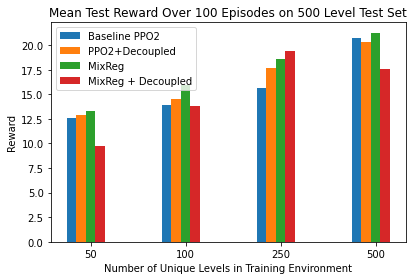

In [ ]:
import matplotlib.pyplot as plt

index = np.arange(4)
bar_width = 0.1

pposcores = [ppo50score, ppo100score, ppo250score, ppo500score]
ppodecoupledscores = [ppodecoupled50score, ppodecoupled100score, ppodecoupled250score, ppodecoupled500score]
mixregscores = [mixreg50score, mixreg100score, mixreg250score, mixreg500score]
mixregdecoupledscores = [decoupled50score, decoupled100score, decoupled250score, decoupled500score]

rects1 = plt.bar(index, pposcores, bar_width,label='Baseline PPO2')
rects2 = plt.bar(index + bar_width, ppodecoupledscores, bar_width,label='PPO2+Decoupled')
rects3 = plt.bar(index + 2 * bar_width, mixregscores, bar_width,label='MixReg')
rects4 = plt.bar(index + 3 * bar_width, mixregdecoupledscores, bar_width,label='MixReg + Decoupled')

plt.xlabel('Number of Unique Levels in Training Environment')
plt.ylabel('Reward')
plt.title('Mean Test Reward Over 100 Episodes on 500 Level Test Set')
plt.xticks(index + 2*bar_width,  ('50', '100', '250', '500'))
plt.legend()

plt.tight_layout()
plt.show()

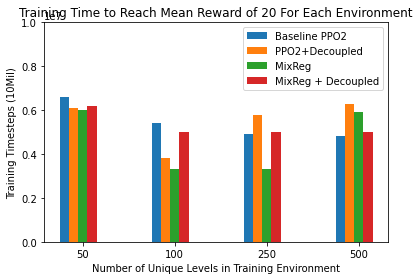

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

index = np.arange(4)
bar_width = 0.1
#Gathering Length of training
ppo50length = pickle.load(open('/content/gdrive/MyDrive/CSW182 Final/50FruitBot/50timestep_array.pickle', 'rb'))
ppo100length = pickle.load(open('/content/gdrive/MyDrive/CSW182 Final/100FruitBot/100timestep_array.pickle', 'rb'))
ppo250length = pickle.load(open('/content/gdrive/MyDrive/CSW182 Final/250FruitBot/250timestep_array.pickle', 'rb'))
ppo500length = pickle.load(open('/content/gdrive/MyDrive/CSW182 Final/500FruitBot/500timestep_array.pickle', 'rb'))
ppo50length = ppo50length[len(ppo50length)-1]
ppo100length = ppo100length[len(ppo100length)-1]
ppo250length = ppo250length[len(ppo250length)-1]
ppo500length = ppo500length[len(ppo500length)-1]

ppodecoupled50length = pickle.load(open('/content/gdrive/MyDrive/CSW182 Final/PPO2+DECOUPLED/dec50timestep_array.pickle', 'rb'))
ppodecoupled100length = pickle.load(open('/content/gdrive/MyDrive/CSW182 Final/PPO2+DECOUPLED/dec100timestep_array.pickle', 'rb'))
ppodecoupled250length = pickle.load(open('/content/gdrive/MyDrive/CSW182 Final/PPO2+DECOUPLED/dec250timestep_array.pickle', 'rb'))
ppodecoupled500length = pickle.load(open('/content/gdrive/MyDrive/CSW182 Final/PPO2+DECOUPLED/dec500timestep_array.pickle', 'rb'))
ppodecoupled50length = ppodecoupled50length[len(ppodecoupled50length)-1]
ppodecoupled100length = ppodecoupled100length[len(ppodecoupled100length)-1]
ppodecoupled250length = ppodecoupled250length[len(ppodecoupled250length)-1]
ppodecoupled500length = ppodecoupled500length[len(ppodecoupled500length)-1]

mixreg50length = pickle.load(open('/content/gdrive/MyDrive/CSW182 Final/50FruitBot/reg50timestep_array.pickle', 'rb'))
mixreg100length = pickle.load(open('/content/gdrive/MyDrive/CSW182 Final/100FruitBot/reg100timestep_array.pickle', 'rb'))
mixreg250length = pickle.load(open('/content/gdrive/MyDrive/CSW182 Final/100FruitBot/reg100timestep_array.pickle', 'rb'))
mixreg500length = pickle.load(open('/content/gdrive/MyDrive/CSW182 Final/500FruitBot/reg500timestep_array.pickle', 'rb'))
mixreg50length = mixreg50length[len(mixreg50length)-1]
mixreg100length = mixreg100length[len(mixreg100length)-1]
mixreg250length = mixreg250length[len(mixreg250length)-1]
mixreg500length = mixreg500length[len(mixreg500length)-1]

mixregdec50length = pickle.load(open('/content/gdrive/MyDrive/CSW182 Final/50FruitBot/dec50timestep_array.pickle', 'rb'))
mixregdec100length = pickle.load(open('/content/gdrive/MyDrive/CSW182 Final/100FruitBot/dec100timestep_array.pickle', 'rb'))
mixregdec250length = pickle.load(open('/content/gdrive/MyDrive/CSW182 Final/100FruitBot/dec100timestep_array.pickle', 'rb'))
mixregdec500length = pickle.load(open('/content/gdrive/MyDrive/CSW182 Final/100FruitBot/dec100timestep_array.pickle', 'rb'))
mixregdec50length = mixregdec50length[len(mixregdec50length)-1]
mixregdec100length = mixregdec100length[len(mixregdec100length)-1]
mixregdec250length = mixregdec250length[len(mixregdec250length)-1]
mixregdec500length = mixregdec500length[len(mixregdec500length)-1]

#Plotting 
ppolengths = [ppo50length, ppo100length, ppo250length, ppo500length]
ppodecoupledlengths = [ppodecoupled50length, ppodecoupled100length, ppodecoupled250length, ppodecoupled500length]
mixreglengths = [mixreg50length, mixreg100length, mixreg250length, mixreg500length]
mixregdecoupledlengths = [mixregdec50length, mixregdec100length, mixregdec250length, mixregdec500length]

rects1 = plt.bar(index, ppolengths, bar_width,label='Baseline PPO2')
rects2 = plt.bar(index + bar_width, ppodecoupledlengths, bar_width,label='PPO2+Decoupled')
rects3 = plt.bar(index + 2 * bar_width, mixreglengths, bar_width,label='MixReg')
rects4 = plt.bar(index + 3 * bar_width, mixregdecoupledlengths, bar_width,label='MixReg + Decoupled')

plt.xlabel('Number of Unique Levels in Training Environment')
plt.ylabel('Training Timesteps (10Mil)')
plt.title('Training Time to Reach Mean Reward of 20 For Each Environment')
plt.xticks(index + 2*bar_width,  ('50', '100', '250', '500'))
plt.ylim(0, 10000000)
plt.legend()

plt.tight_layout()
plt.show()

# Training on Test Environment Using Best Model: Baseline Decoupled

In [ ]:
#MIXREG DECOUPLED
import sys
sys.path.append('/content/gdrive/MyDrive/CSW182 Final')

import imageio
import time
import numpy as np
import base64
import IPython
import PIL.Image
import pyvirtualdisplay
import pickle

# Video 
from pathlib import Path
from IPython import display as ipythondisplay

# Stable baselines

from helpers import record
from DECOUPLED_ImpalaCnn import ImpalaCnn

from stable_baselines import PPO2
from stable_baselines.common.evaluation import evaluate_policy
from gym3 import ToGymEnv, ViewerWrapper, ExtractDictObWrapper
from stable_baselines.common.vec_env.dummy_vec_env import DummyVecEnv
from procgen import ProcgenGym3Env

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

In [22]:
import matplotlib.pyplot as plt

def run_training(model, steps_per_round=1000,limit=5000):
# This function will run a training with value set in `steps_per_round`
# after each round it will measure it's value, If value is under `limit` it will keep training until score limit is reached.  
  score = 0
  best_score = -10000
  score_array = []
  # score_array = pickle.load(open('/content/gdrive/MyDrive/CSW182 Final/PPO2+DECOUPLED/dec250score_array.pickle', 'rb'))
  # timestep_array = pickle.load(open( '/content/gdrive/MyDrive/CSW182 Final/PPO2+DECOUPLED/dec250timestep_array.pickle', 'rb'))
  # steps_total = timestep_array[len(timestep_array) - 1]
  steps_total = 0

  while steps_total < limit:
      steps_total = steps_total + steps_per_round
      model.learn(total_timesteps=steps_per_round)

      new_evaluation = evaluate_policy(model, env, n_eval_episodes=500, deterministic=True, render=False, callback=None, reward_threshold=None, return_episode_rewards=False)
      score = new_evaluation[0]
      # timestep_array.append(steps_total)
      score_array.append(score)

      # if score > best_score:
      #   best_score = score
        
        #record(model, length=1000) # uncomment to show video from each round
      print('steps_total: ' + str(steps_total))
      print("Mean reward:", score )
    

  # Threshold reached > evaluate over 100 episodes > Video rec/display
  # print("Reward limit achived, measuring over 100ep & recording video, please wait...")
  # record(model, length=1000)
  # ep100 = evaluate_policy(model, env, n_eval_episodes=100, deterministic=True, render=False, callback=None, reward_threshold=None, return_episode_rewards=False)
  # print("Mean Reward 100 Episodes: ", ep100[0])
  # plt.plot(timestep_array, score_array)
  # plt.xlabel('Total Timesteps')
  # plt.ylabel('Mean reward over 100 different levels')
  return score_array  


In [ ]:
best_model = PPO2.load('/content/gdrive/MyDrive/CSW182 Final/PPO2+DECOUPLED/500decoupled_impala.best', env = env, policy=ImpalaCnn)

In [ ]:
aa=run_training(best_model)

In [ ]:
np.array(aa)

array([20.74, 21.51, 18.7 , 18.38, 20.71, 16.86, 17.15, 20.2 , 20.65,
       21.25, 19.66, 17.75, 19.67, 18.98, 19.66, 20.99, 18.82, 19.74,
       18.85, 18.35], dtype=float32)

In [25]:
np.savetxt("foo.csv", aa, delimiter=",")

In [23]:
best_model = PPO2.load('/content/gdrive/MyDrive/CSW182 Final/PPO2+DECOUPLED/500decoupled_impala.best', env = env, policy=ImpalaCnn)

In [24]:
bb=run_training(best_model) 

steps_total: 1000
Mean reward: 18.832


KeyboardInterrupt: ignored

In [ ]:
np.array(bb)

# 